# **Colour Images in Python**

In this notebook, you will learn how to work with colour images in Python. Colour images differ from grayscale images; should you feel confident in adding the extra complexity to your projects, this notebook will underline some of the foundational concepts pertaining to colour images. 

Let's first import our libraries; we will be using *numpy* for mathematical procedure, *pil* for image manipulation, and *matplotlib* for graphing  

In [1]:
import numpy as np 
from PIL import Image 
import matplotlib.pyplot as plt

Let's load an image and display it; I am going to use 'cat.jpg', the same as before, but this time I will explicitly convert it to 'RGB'. I suggest you do the same if using a custom image to ensure you are working with an 'RGB' image. 

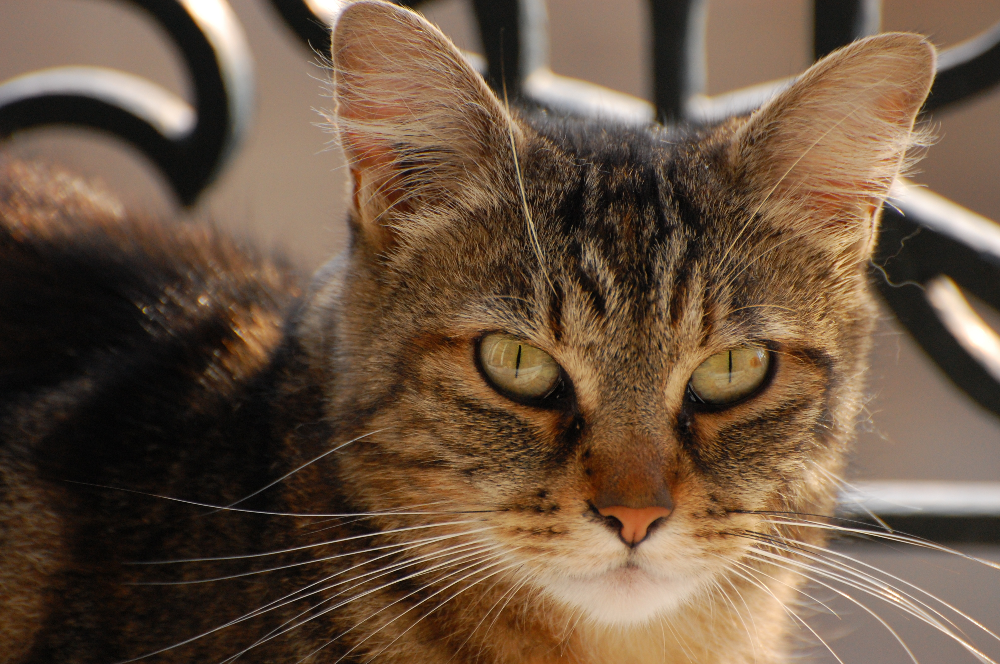

In [3]:
image_path = 'cat.jpg'
cat_image = Image.open(image_path).convert('RGB')
cat_image

Let's resize this image too; we will go very small this time, why shall become clear later...

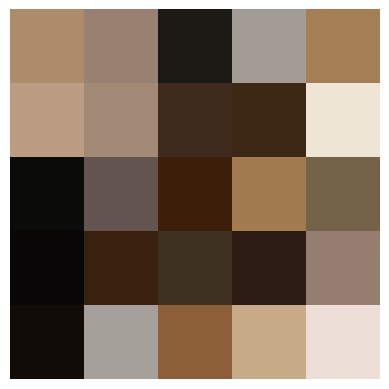

In [6]:
resized_cat = cat_image.resize((5, 5), Image.NEAREST)

plt.figure()
plt.imshow(resized_cat)
plt.axis('off')
plt.show()

Let's also convert this image to a numpy array and view its dimensions. 

In [7]:
pixel_values = np.array(resized_cat)
pixel_values.shape

(5, 5, 3)

Our image is a three-dimensional array; 5 pixels by 5 pixels as we specified, but with a third dimension of value '3'. This third dimension pertains to the images colour! Three values for Red, Green, and Blue channels. 

We can split this image into the three colour channels to observe further what they are. 

In [11]:
red, green, blue = resized_cat.split()

red_pixels = np.array(red)
green_pixels = np.array(green)
blue_pixels = np.array(blue)

Let's overlay these values on top of the image to see what's going on. Don't be thrown off by the code! MatPlotLib confuses the best of us!

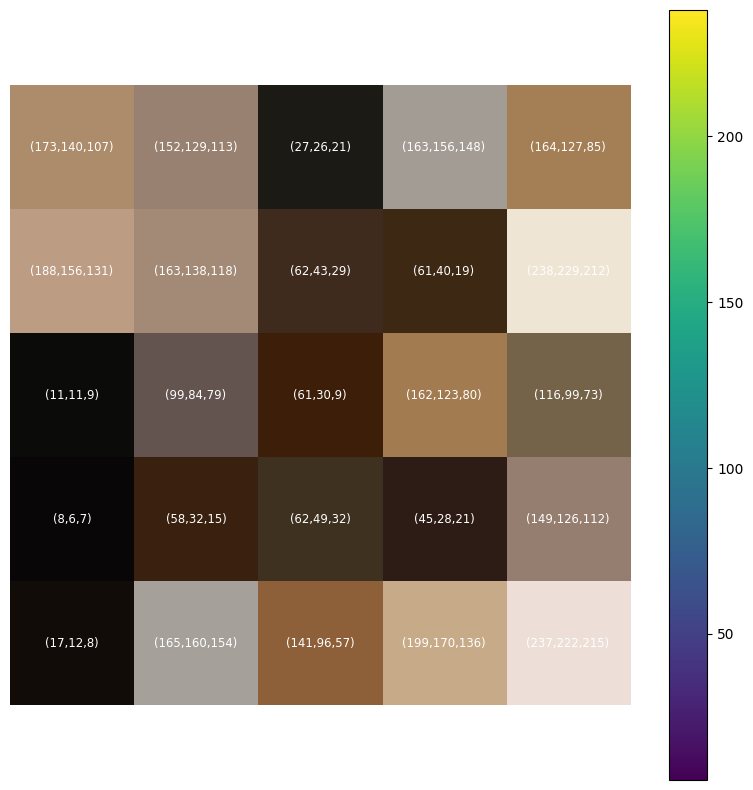

In [14]:
plt.figure(figsize=(10, 10))
plt.imshow(resized_cat, interpolation='nearest')
plt.colorbar()
for i in range(pixel_values.shape[0]):
    for j in range(pixel_values.shape[1]):
        r_val = red_pixels[i, j]
        g_val = green_pixels[i, j]
        b_val = blue_pixels[i, j]
        plt.text(j, i, f'({r_val},{g_val},{b_val})', fontsize='small', ha='center', va='center', color='white')
plt.axis('off')
plt.show()

As we can see, our image now has three values per pixel; each corresponding to amount of either red, green, or blue present in that particular pixel! 

This helps, but to stress the point, let's further split up the image into a red image, green image, and blue image, and see what the pixel values of each looks like. We'll start by creating a black image to neutralise the other two colours present in each image. 

In [17]:
black = Image.new('L', resized_cat.size)

Next, let's create the red, green, and blue image by merging the black image with the splits we made earlier. 

In [19]:
red_image = Image.merge('RGB', (red, black, black))
green_image = Image.merge('RGB', (black, green, black))
blue_image = Image.merge('RGB', (black, black, blue))

Let's now display our images and see the results. 

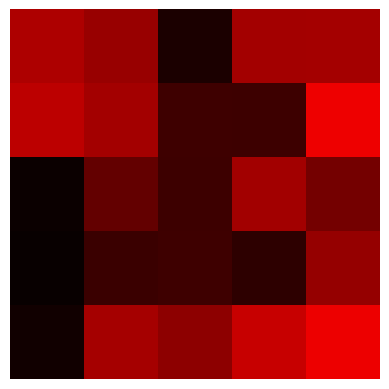

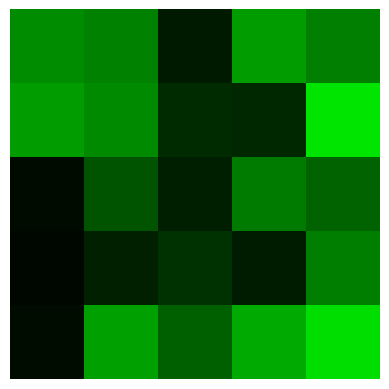

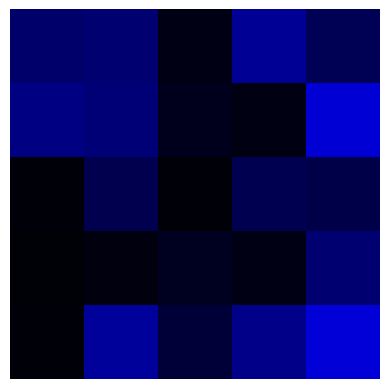

In [20]:
# Red Image
plt.figure()
plt.imshow(red_image)
plt.axis('off')
plt.show()

# Green Image
plt.figure()
plt.imshow(green_image)
plt.axis('off')
plt.show()

# Blue Image
plt.figure()
plt.imshow(blue_image)
plt.axis('off')
plt.show()

Perfect! A red, green, and blue image. Let's finish by obtaining each images pixel values. 

In [41]:
red_image_pixels = np.array(red_image)
green_image_pixels = np.array(green_image)
blue_image_pixels = np.array(blue_image)

print(f"Red Image Pixels: \n{red_image_pixels}\n")
print(f"Green Image Pixels: \n{green_image_pixels}\n")
print(f"Blue Image Pixels: \n{blue_image_pixels}")

Red Image Pixels: 
[[[173   0   0]
  [152   0   0]
  [ 27   0   0]
  [163   0   0]
  [164   0   0]]

 [[188   0   0]
  [163   0   0]
  [ 62   0   0]
  [ 61   0   0]
  [238   0   0]]

 [[ 11   0   0]
  [ 99   0   0]
  [ 61   0   0]
  [162   0   0]
  [116   0   0]]

 [[  8   0   0]
  [ 58   0   0]
  [ 62   0   0]
  [ 45   0   0]
  [149   0   0]]

 [[ 17   0   0]
  [165   0   0]
  [141   0   0]
  [199   0   0]
  [237   0   0]]]

Green Image Pixels: 
[[[  0 140   0]
  [  0 129   0]
  [  0  26   0]
  [  0 156   0]
  [  0 127   0]]

 [[  0 156   0]
  [  0 138   0]
  [  0  43   0]
  [  0  40   0]
  [  0 229   0]]

 [[  0  11   0]
  [  0  84   0]
  [  0  30   0]
  [  0 123   0]
  [  0  99   0]]

 [[  0   6   0]
  [  0  32   0]
  [  0  49   0]
  [  0  28   0]
  [  0 126   0]]

 [[  0  12   0]
  [  0 160   0]
  [  0  96   0]
  [  0 170   0]
  [  0 222   0]]]

Blue Image Pixels: 
[[[  0   0 107]
  [  0   0 113]
  [  0   0  21]
  [  0   0 148]
  [  0   0  85]]

 [[  0   0 131]
  [  0   0 118]
  [ 

There we have it! Each colour channel only stores values for the channel it corresponds too! 